In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mskorski/tree-counting-image-dataset")

print("Path to dataset files:", path)

100%|██████████| 7.57M/7.57M [00:00<00:00, 129MB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/mskorski/tree-counting-image-dataset/versions/2


In [4]:
!pip install ultralytics

In [6]:
#@title 1/ Install packages and mount Google Drive
# Run this cell first. It installs required packages and mounts Google Drive.
# If you already have ultralytics installed, reinstalling is fine.
# For W&B, sign in if you wish (optional).

# --- User-editable ---
DRIVE_ROOT = "/content/drive/MyDrive/tree_count"  # change if you want another path
USE_WANDB = False  # set True if you want Weights & Biases tracking (you will be asked to login)
# ----------------------

# Install libraries
!pip install -q ultralytics==8.1.0  # stable-ish ultralytics (YOLOv8)
!pip install -q albumentations==1.3.1 opencv-python-headless matplotlib seaborn pycocotools
!pip install -q kaggle   # optional: if you plan to download datasets from Kaggle
!pip install -q tqdm pandas shapely scikit-learn fpdf

if USE_WANDB:
  !pip install -q wandb

# Mount Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Create reproducible folder structure
import os, textwrap
folders = [
    DRIVE_ROOT,
    os.path.join(DRIVE_ROOT, "data"),
    os.path.join(DRIVE_ROOT, "data", "train","images"),
    os.path.join(DRIVE_ROOT, "data", "train","labels"),
    os.path.join(DRIVE_ROOT, "data", "val","images"),
    os.path.join(DRIVE_ROOT, "data", "val","labels"),
    os.path.join(DRIVE_ROOT, "data", "test","images"),
    os.path.join(DRIVE_ROOT, "data", "test","labels"),
    os.path.join(DRIVE_ROOT, "experiments"),
    os.path.join(DRIVE_ROOT, "models"),
    os.path.join(DRIVE_ROOT, "reports"),
]
for p in folders:
    os.makedirs(p, exist_ok=True)

print("Folders created under:", DRIVE_ROOT)
print("\nSample listing:")
!ls -la "{DRIVE_ROOT}"


Mounted at /content/drive


Total images: 73


,count
count,73.000000
mean,82.219178
std,42.453650
min,7.000000
25%,57.000000
50%,77.000000
75%,100.000000
max,253.000000


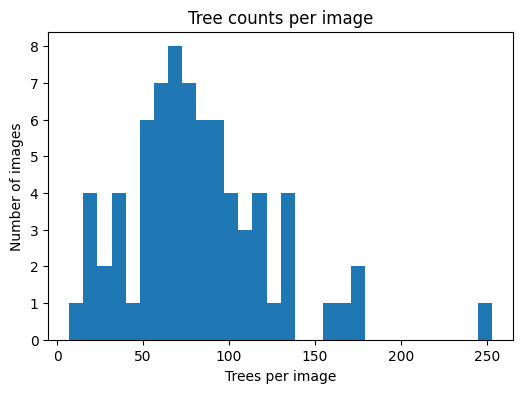

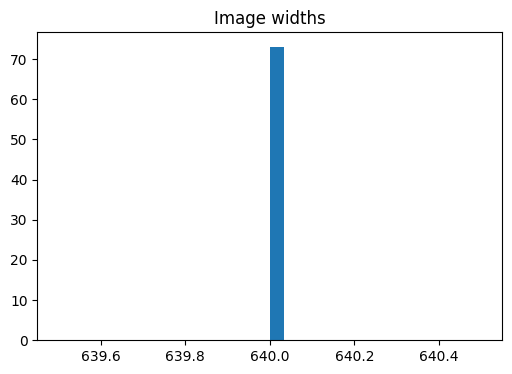

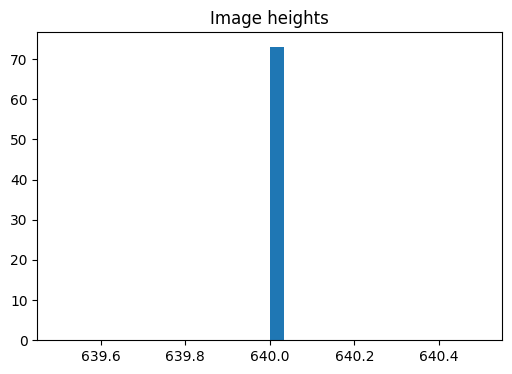

Class distribution (if multi-class): Counter({0: 6002})
Problematic samples (examples):
empty_labels : 0 examples (first 10): []
tiny_boxes : 15 examples (first 10): ['rc_261714_4_174456_4_19_jpg.rf.1f075a7e5665a70a00212314ec6416b8', 'sr_262183_4_174543_4_19_jpg.rf.1d94e3f8b3fe056dce60ae220a5ea618', 'wm_262126_4_174161_4_19_jpg.rf.d1c09d453b2f8be2fe5749caba56d022', 'kg_261733_4_174526_4_19_jpg.rf.c15a5bd1c6a8ebd255c1b61c48a6c6ca', 'sr_262187_4_174547_4_19_jpg.rf.467fd69d0e17331b9396bff7b2e3df4d', 'sg_262074_4_174318_4_19_jpg.rf.314612fa697eea23f5d34a91335e44c7', 'cr_261969_4_174260_4_19_jpg.rf.4b04b440fe329478f7454af50bd42a05', 'el_262187_4_174500_4_19_jpg.rf.001f03055ad8808501e9208e15f3764b', 'st_261964_4_174521_4_19_jpg.rf.1305eb4b9d786bcf5bdf907e7d51bd52', 'wm_262130_4_174161_4_19_jpg.rf.14b2b7c40de7477e0de0dc705f7892f8']
overlap : 0 examples (first 10): []


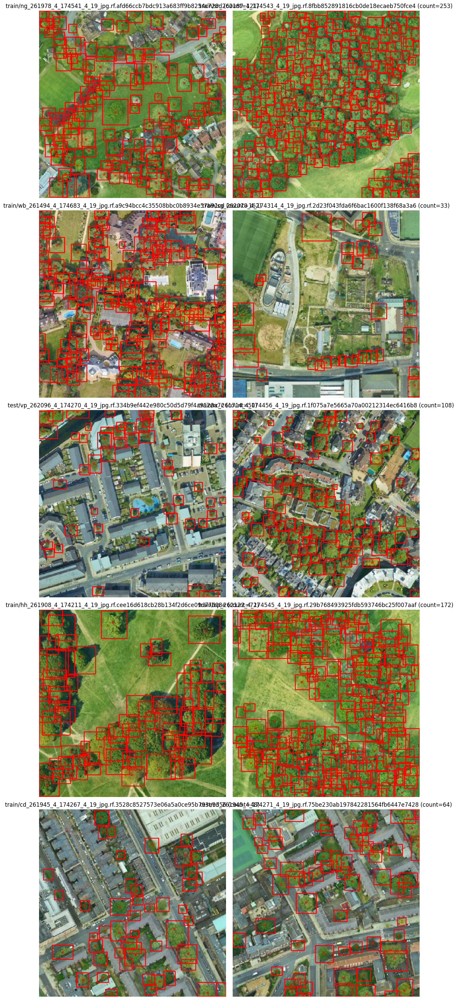

In [8]:
#@title 4/ Exploratory Data Analysis (EDA)
# Run this after you have images and labels in DRIVE_ROOT/data/
import os, glob, matplotlib.pyplot as plt, random
import pandas as pd, numpy as np, cv2
from collections import Counter
DR = DRIVE_ROOT
data_yaml = os.path.join(DR, 'data','data.yaml')
# helper to read YOLO labels
def read_yolo_labels(lbl_path):
    with open(lbl_path,'r') as f:
        lines = [l.strip() for l in f if l.strip()]
    boxes = []
    for l in lines:
        parts = l.split()
        if len(parts) >= 5:
            cls = int(float(parts[0])); xc=float(parts[1]); yc=float(parts[2]); w=float(parts[3]); h=float(parts[4])
            boxes.append((cls, xc, yc, w, h))
    return boxes

# gather image -> count
sets = ['train','val','test']
counts=[]
sizes=[]
cls_counts = Counter()
problematic = {'empty_labels':[], 'tiny_boxes':[], 'overlap':[]}

for s in sets:
    imgs = glob.glob(os.path.join(DR,'data',s,'images','*'))
    for im in imgs:
        base = os.path.splitext(os.path.basename(im))[0]
        lbl = os.path.join(DR,'data',s,'labels', base + '.txt')
        boxes = []
        if os.path.exists(lbl):
            boxes = read_yolo_labels(lbl)
        counts.append({'set':s,'image':base,'count':len(boxes)})
        # collect sizes
        img = cv2.imread(im)
        h,w = img.shape[:2]
        sizes.append((w,h))
        # class counts
        for b in boxes:
            cls_counts[b[0]] += 1
            # detect tiny boxes (norm area < 0.0005)
            area = b[3]*b[4]
            if area < 0.0005:
                problematic['tiny_boxes'].append(base)
        if len(boxes)==0:
            problematic['empty_labels'].append(base)
# show distributions
df = pd.DataFrame(counts)
print("Total images:", len(df))
display(df['count'].describe())
plt.figure(figsize=(6,4))
plt.hist(df['count'], bins=30)
plt.title('Tree counts per image')
plt.xlabel('Trees per image'); plt.ylabel('Number of images'); plt.show()

# image size histogram
ws = [w for w,h in sizes]
hs = [h for w,h in sizes]
plt.figure(figsize=(6,4)); plt.hist(ws, bins=30); plt.title('Image widths'); plt.show()
plt.figure(figsize=(6,4)); plt.hist(hs, bins=30); plt.title('Image heights'); plt.show()

print("Class distribution (if multi-class):", cls_counts)
print("Problematic samples (examples):")
for k,v in problematic.items():
    print(k, ":", len(set(v)), "examples (first 10):", list(set(v))[:10])
# show sample annotated images (draw boxes)
def show_annotated_samples(n=10):
    samples = df.sample(n=min(n,len(df)))
    fig, axs = plt.subplots(nrows=min(n,5), ncols=2, figsize=(12, min(30, n*3)))
    axs = axs.flatten()
    for i,(_, row) in enumerate(samples.iterrows()):
        setname = row['set']; imgname = row['image']
        imgfile = os.path.join(DR,'data',setname,'images', imgname + os.path.splitext(glob.glob(os.path.join(DR,'data',setname,'images', imgname + '*'))[0])[1])
        im = cv2.cvtColor(cv2.imread(imgfile), cv2.COLOR_BGR2RGB)
        lblfile = os.path.join(DR,'data',setname,'labels', imgname + '.txt')
        if os.path.exists(lblfile):
            boxes = read_yolo_labels(lblfile)
            h,w = im.shape[:2]
            for b in boxes:
                cls,xc,yc,nw,nh = b
                x1 = int((xc - nw/2)*w); y1 = int((yc - nh/2)*h)
                x2 = int((xc + nw/2)*w); y2 = int((yc + nh/2)*h)
                cv2.rectangle(im, (x1,y1),(x2,y2), (255,0,0), 2)
        axs[i].imshow(im); axs[i].axis('off'); axs[i].set_title(f"{setname}/{imgname} (count={row['count']})")
    plt.tight_layout(); plt.show()

show_annotated_samples(10)


In [9]:
#@title 5/ Preprocessing & Augmentations (Albumentations pipelines + tiling utility)
import albumentations as A, cv2, os, math
from albumentations.pytorch import ToTensorV2
import numpy as np

# Example augmentation pipeline for training (YOLO-friendly)
def get_train_augmentations(img_size=640):
    transform = A.Compose([
        A.RandomResizedCrop(height=img_size, width=img_size, scale=(0.6,1.0), p=0.5),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.RandomRotate90(p=0.5),
        A.RandomBrightnessContrast(p=0.6),
        A.GaussNoise(p=0.2),
        A.MotionBlur(blur_limit=5, p=0.2),
        A.CoarseDropout(max_holes=8, max_height=30, max_width=30, min_holes=1, p=0.3), # cutout
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
    return transform

# Example tiling function (preserves aspect ratio by padding then tiling)
def tile_with_padding(img, tile_size=512, stride=512):
    h,w = img.shape[:2]
    pad_h = (math.ceil(h / tile_size) * tile_size) - h
    pad_w = (math.ceil(w / tile_size) * tile_size) - w
    img_padded = cv2.copyMakeBorder(img, 0, pad_h, 0, pad_w, cv2.BORDER_CONSTANT, value=[0,0,0])
    tiles = []
    H, W = img_padded.shape[:2]
    for y in range(0, H, stride):
        for x in range(0, W, stride):
            tile = img_padded[y:y+tile_size, x:x+tile_size]
            tiles.append(((x,y), tile))
    return tiles

print("Pipelines ready. Use get_train_augmentations() in your custom dataset loader.")


Pipelines ready. Use get_train_augmentations() in your custom dataset loader.


In [8]:
#@title 6/ Quick training example (YOLOv8) — edit hyperparams and run
from ultralytics import YOLO
import os, time
DR = DRIVE_ROOT


# USER EDIT: choose model size 'yolov8n.pt','yolov8s.pt','yolov8m.pt','yolov8l.pt'
MODEL = "yolov8n.pt"
DATA_YAML = os.path.join(DR,'data','data.yaml')  # ensure this exists
EPOCHS = 100
BATCH = 8
IMGSZ = 640
SAVE_PERIOD = 5  # save every N epochs
PROJECT = os.path.join(DR,'experiments')

# Create an instance (this will download the small model if not present)
y = YOLO(MODEL)
print("Starting training. Checkpoints and logs will be saved to", PROJECT)
y.train(data=DATA_YAML, epochs=EPOCHS, batch=BATCH, imgsz=IMGSZ, name=f"yolov8_train_{int(time.time())}", save_period=SAVE_PERIOD)

Starting training. Checkpoints and logs will be saved to /content/drive/MyDrive/tree_count/experiments
New https://pypi.org/project/ultralytics/8.3.222 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/tree_count/data/data.yaml, epochs=100, time=None, patience=50, batch=8, imgsz=640, save=True, save_period=5, cache=False, device=None, workers=8, project=None, name=yolov8_train_1761773967, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=

/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:634: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location="cpu"), file  # load


 18                  -1  1    123648  ultralytics.nn.modules.block.C2f             [192, 128, 1]                 
 19                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    751507  ultralytics.nn.modules.head.Detect           [1, [64, 128, 256]]           
Model summary: 225 layers, 3011043 parameters, 3011027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
TensorBoard: Start with 'tensorboard --logdir runs/detect/yolov8_train_1761773967', view at http://localhost:6006/


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:634: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location="cpu"), file  # load


AMP: checks passed ✅


/usr/local/lib/python3.12/dist-packages/ultralytics/engine/trainer.py:271: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning /content/drive/MyDrive/tree_count/data/train/labels... 64 images, 0 backgrounds, 0 corrupt: 100%|██████████| 64/64 [00:00<00:00, 113.35it/s]

train: New cache created: /content/drive/MyDrive/tree_count/data/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/tree_count/data/valid/labels... 18 images, 0 backgrounds, 0 corrupt: 100%|██████████| 18/18 [00:18<00:00,  1.05s/it]

val: New cache created: /content/drive/MyDrive/tree_count/data/valid/labels.cache


Plotting labels to runs/detect/yolov8_train_1761773967/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.41G      3.133      3.545      2.221        700        640: 100%|██████████| 8/8 [00:04<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.13it/s]

                   all         18       1524     0.0489      0.173      0.029     0.0104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       2.2G      2.639      3.359      1.876        794        640: 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.31it/s]

                   all         18       1524     0.0981      0.348     0.0785     0.0265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.06G      2.432      2.712      1.564        717        640: 100%|██████████| 8/8 [00:01<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         18       1524      0.127      0.451      0.149     0.0529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.33G      2.315      2.045      1.472        537        640: 100%|██████████| 8/8 [00:01<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.49it/s]

                   all         18       1524      0.599      0.468      0.429      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.97G      2.286      1.741      1.428       1085        640: 100%|██████████| 8/8 [00:01<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all         18       1524      0.629      0.572      0.519      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       2.1G      2.213      1.535      1.383        590        640: 100%|██████████| 8/8 [00:01<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.39it/s]

                   all         18       1524      0.675      0.659      0.602      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.13G      2.221      1.502      1.378        938        640: 100%|██████████| 8/8 [00:02<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         18       1524      0.595      0.642      0.566       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.19G       2.17      1.476      1.377        765        640: 100%|██████████| 8/8 [00:01<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.18it/s]

                   all         18       1524      0.595      0.645      0.571      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       2.1G      2.174      1.381      1.361       1143        640: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.66it/s]

                   all         18       1524      0.595      0.675      0.566      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.67G      2.139      1.335       1.36        924        640: 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.45it/s]

                   all         18       1524      0.528       0.64      0.496      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.36G      2.139      1.334      1.343        756        640: 100%|██████████| 8/8 [00:02<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.51it/s]

                   all         18       1524      0.544      0.692      0.566      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.01G      2.097      1.325      1.379        638        640: 100%|██████████| 8/8 [00:01<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.62it/s]

                   all         18       1524      0.539       0.71      0.548      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.89G       2.09      1.316      1.372        925        640: 100%|██████████| 8/8 [00:01<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.79it/s]

                   all         18       1524      0.513      0.675      0.482      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.02G      2.101      1.283      1.386        884        640: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.80it/s]

                   all         18       1524      0.548      0.661      0.493      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.23G      2.106      1.319      1.371        946        640: 100%|██████████| 8/8 [00:02<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         18       1524      0.631      0.694      0.579      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100       2.2G      2.074      1.318      1.376        681        640: 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.27it/s]

                   all         18       1524      0.674      0.742      0.637      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.53G        2.1      1.257      1.366       1113        640: 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all         18       1524      0.621      0.705      0.578      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       1.9G      2.049      1.255      1.341        687        640: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         18       1524      0.683      0.715      0.649      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       2.2G      2.071      1.265      1.316        503        640: 100%|██████████| 8/8 [00:02<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         18       1524      0.758      0.749      0.734      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.59G      2.058       1.26      1.331        815        640: 100%|██████████| 8/8 [00:01<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.06it/s]

                   all         18       1524       0.75      0.745      0.747      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.01G      2.024      1.242      1.294        821        640: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.18it/s]

                   all         18       1524      0.651      0.738      0.671      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.65G      2.009      1.313      1.316       1661        640: 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.23it/s]

                   all         18       1524      0.627      0.701      0.634      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.46G       1.99      1.186      1.299       1106        640: 100%|██████████| 8/8 [00:02<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.61it/s]

                   all         18       1524      0.708      0.715      0.698       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.08G       1.96      1.198      1.346        588        640: 100%|██████████| 8/8 [00:01<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.59it/s]

                   all         18       1524      0.747      0.728      0.728      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.38G      1.978      1.156      1.322        915        640: 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.89it/s]

                   all         18       1524      0.721      0.698      0.698      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.21G      1.963      1.161      1.321        942        640: 100%|██████████| 8/8 [00:01<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.23it/s]

                   all         18       1524      0.717      0.684      0.683      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.32G      1.973      1.167      1.294        994        640: 100%|██████████| 8/8 [00:01<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         18       1524      0.734      0.732      0.697      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.73G      1.986      1.176        1.3        990        640: 100%|██████████| 8/8 [00:01<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         18       1524      0.739      0.766      0.704      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.73G      1.956      1.168      1.311        826        640: 100%|██████████| 8/8 [00:01<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]

                   all         18       1524      0.721      0.749      0.664      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.35G       1.97      1.112      1.255        909        640: 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.90it/s]

                   all         18       1524      0.736      0.751      0.675      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.08G      1.921      1.113       1.31        930        640: 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]

                   all         18       1524      0.747      0.719      0.709       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.48G      1.898      1.112      1.298        862        640: 100%|██████████| 8/8 [00:02<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.72it/s]

                   all         18       1524      0.755      0.708      0.734      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.99G      1.945      1.149      1.285       1179        640: 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.75it/s]

                   all         18       1524      0.796      0.717      0.777      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.11G       1.94      1.141       1.28        894        640: 100%|██████████| 8/8 [00:01<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.13it/s]

                   all         18       1524      0.812      0.753      0.809      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.44G      1.991      1.183       1.27        697        640: 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.76it/s]

                   all         18       1524      0.796      0.759      0.798      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.79G      2.006      1.212      1.293        555        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         18       1524      0.766      0.766      0.778      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.14G      1.897      1.181      1.261        945        640: 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.67it/s]

                   all         18       1524      0.699      0.688      0.686      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.16G      1.908      1.172       1.27        787        640: 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.34it/s]

                   all         18       1524      0.678      0.646      0.646      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.39G      1.912      1.163      1.292        897        640: 100%|██████████| 8/8 [00:01<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.01it/s]

                   all         18       1524      0.722       0.65      0.684      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.38G      1.877      1.148      1.304       1072        640: 100%|██████████| 8/8 [00:01<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         18       1524      0.762      0.697       0.75      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.37G      1.863      1.137      1.296        576        640: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.90it/s]

                   all         18       1524      0.801      0.727      0.791      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.42G      1.868      1.108      1.261       1014        640: 100%|██████████| 8/8 [00:01<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.99it/s]

                   all         18       1524      0.801      0.756      0.806      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.22G      1.894      1.115      1.267        890        640: 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.69it/s]

                   all         18       1524      0.804       0.78      0.791      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.48G      1.904      1.111      1.256        805        640: 100%|██████████| 8/8 [00:01<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         18       1524      0.796      0.777      0.765      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.24G      1.898       1.17      1.302        512        640: 100%|██████████| 8/8 [00:02<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.06it/s]

                   all         18       1524      0.746      0.744      0.692      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.09G      1.917      1.155      1.294       1341        640: 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         18       1524      0.734      0.735      0.671      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       2.6G      1.846      1.081      1.261        805        640: 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.72it/s]

                   all         18       1524      0.763       0.75      0.701      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.59G      1.861      1.095      1.271        883        640: 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.14it/s]

                   all         18       1524      0.789      0.772      0.747      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.54G      1.877      1.084      1.249       1126        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         18       1524      0.835      0.789      0.807      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.21G      1.876       1.09      1.281        843        640: 100%|██████████| 8/8 [00:01<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         18       1524      0.827      0.777      0.806      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.42G      1.931      1.092       1.31        577        640: 100%|██████████| 8/8 [00:01<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]

                   all         18       1524      0.822      0.772      0.801      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.84G      1.891      1.141      1.271       1137        640: 100%|██████████| 8/8 [00:01<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all         18       1524      0.778       0.74      0.774      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.64G      1.935      1.135       1.26        871        640: 100%|██████████| 8/8 [00:02<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         18       1524      0.742      0.711      0.741      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.63G      1.868      1.089      1.282       1001        640: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.51it/s]

                   all         18       1524      0.749      0.701      0.739       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.34G      1.833      1.048      1.252        655        640: 100%|██████████| 8/8 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.10it/s]

                   all         18       1524      0.765      0.711      0.739       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.46G      1.859      1.098      1.284       1069        640: 100%|██████████| 8/8 [00:01<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all         18       1524       0.81      0.759      0.775      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.35G        1.8      1.052      1.246        708        640: 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.35it/s]

                   all         18       1524      0.842      0.774      0.801      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.49G      1.836      1.057      1.248       1196        640: 100%|██████████| 8/8 [00:02<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         18       1524       0.85      0.786      0.812      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.35G       1.85      1.021      1.242        742        640: 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.13it/s]

                   all         18       1524      0.852       0.77      0.805       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.36G      1.836      1.023      1.227        864        640: 100%|██████████| 8/8 [00:01<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]

                   all         18       1524      0.843      0.768      0.796      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.99G      1.872      1.041      1.272       1009        640: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.32it/s]

                   all         18       1524      0.803      0.731      0.761      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.59G       1.83       1.04      1.268        932        640: 100%|██████████| 8/8 [00:02<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         18       1524      0.765      0.709       0.72      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.28G      1.883      1.052       1.25        916        640: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.28it/s]

                   all         18       1524      0.766      0.722       0.72      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.06G      1.827      1.029      1.261        744        640: 100%|██████████| 8/8 [00:01<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]

                   all         18       1524      0.794      0.755      0.753      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.36G      1.829      1.027      1.249        616        640: 100%|██████████| 8/8 [00:01<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.16it/s]

                   all         18       1524      0.819      0.781      0.784      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.36G       1.83      1.053      1.236        819        640: 100%|██████████| 8/8 [00:01<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         18       1524       0.83      0.805      0.809      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.73G      1.849      1.032      1.225       1057        640: 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.36it/s]

                   all         18       1524      0.836      0.814      0.823      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.24G      1.812      1.002      1.241        702        640: 100%|██████████| 8/8 [00:01<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         18       1524      0.852      0.816      0.832      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.45G      1.815     0.9879      1.215        846        640: 100%|██████████| 8/8 [00:01<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.62it/s]

                   all         18       1524      0.867      0.818      0.846      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       2.2G      1.806     0.9935      1.255        760        640: 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         18       1524       0.86      0.812      0.836      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.97G      1.871      1.035       1.27        990        640: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]

                   all         18       1524      0.843      0.794      0.815      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.27G      1.781      1.005      1.243        606        640: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]

                   all         18       1524       0.82      0.772      0.782       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.41G      1.848      1.046      1.256        661        640: 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.95it/s]

                   all         18       1524      0.816      0.764      0.773      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       2.3G      1.787      1.002      1.223       1016        640: 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         18       1524      0.821      0.767      0.779      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100       2.8G      1.794      1.042      1.251        921        640: 100%|██████████| 8/8 [00:02<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.90it/s]

                   all         18       1524      0.834       0.79      0.796       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.96G      1.822      1.046      1.263        870        640: 100%|██████████| 8/8 [00:01<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.33it/s]

                   all         18       1524      0.835      0.794      0.798      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       2.1G      1.841     0.9959      1.244        937        640: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.02it/s]

                   all         18       1524      0.836      0.789      0.794       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.93G      1.799      1.002       1.26        630        640: 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.11it/s]

                   all         18       1524       0.83      0.796      0.792      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.75G      1.836     0.9891      1.239        856        640: 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         18       1524      0.825      0.793      0.788      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       2.4G      1.789       1.02      1.238        710        640: 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]

                   all         18       1524      0.813      0.779      0.781      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.45G      1.775     0.9771      1.212        803        640: 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.73it/s]

                   all         18       1524      0.805      0.765      0.776      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.45G      1.765     0.9907      1.236        969        640: 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.90it/s]

                   all         18       1524      0.808      0.764      0.779      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.21G      1.767      1.001       1.23        997        640: 100%|██████████| 8/8 [00:01<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]

                   all         18       1524       0.82      0.775      0.787      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.55G      1.761      1.009      1.257        696        640: 100%|██████████| 8/8 [00:02<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.80it/s]

                   all         18       1524      0.817      0.769      0.784      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.77G      1.783       1.01      1.243       1039        640: 100%|██████████| 8/8 [00:01<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.42it/s]

                   all         18       1524      0.803      0.767      0.782      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.36G      1.748     0.9977      1.233        892        640: 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.27it/s]

                   all         18       1524      0.816      0.779      0.789       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.04G       1.81      1.012      1.261        778        640: 100%|██████████| 8/8 [00:01<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.88it/s]

                   all         18       1524      0.832      0.785      0.801      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.01G      1.784      1.008      1.254        615        640: 100%|██████████| 8/8 [00:02<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]


                   all         18       1524      0.837      0.787      0.799      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.98G      1.739     0.9547      1.228        987        640: 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.91it/s]

                   all         18       1524      0.839      0.791      0.799      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.04G      1.761     0.9745      1.237        734        640: 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.17it/s]

                   all         18       1524      0.834      0.789      0.791      0.341


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.74G      1.766       1.05      1.209        450        640: 100%|██████████| 8/8 [00:02<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.97it/s]

                   all         18       1524      0.838      0.787      0.792      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.96G      1.771      1.035      1.231        377        640: 100%|██████████| 8/8 [00:02<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.68it/s]

                   all         18       1524      0.831      0.783      0.789      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.07G      1.773      1.048       1.26        423        640: 100%|██████████| 8/8 [00:01<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.25it/s]

                   all         18       1524      0.827      0.785       0.79      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.61G      1.786      1.048      1.261        543        640: 100%|██████████| 8/8 [00:01<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.09it/s]

                   all         18       1524       0.82      0.782      0.787      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.02G      1.728     0.9977      1.232        482        640: 100%|██████████| 8/8 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]

                   all         18       1524      0.819      0.777      0.787      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.56G      1.765      1.031      1.236        625        640: 100%|██████████| 8/8 [00:01<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.70it/s]

                   all         18       1524      0.814      0.774      0.788      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.64G      1.746      1.059      1.259        530        640: 100%|██████████| 8/8 [00:02<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.97it/s]

                   all         18       1524      0.804      0.762       0.78      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.73G      1.734       1.02      1.246        635        640: 100%|██████████| 8/8 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.18it/s]

                   all         18       1524      0.804      0.762      0.781      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.81G       1.79      1.063      1.261        452        640: 100%|██████████| 8/8 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.61it/s]

                   all         18       1524      0.802      0.759      0.779      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.71G      1.748      1.042      1.243        450        640: 100%|██████████| 8/8 [00:01<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.71it/s]

                   all         18       1524      0.799       0.75      0.775      0.345



100 epochs completed in 0.095 hours.
Optimizer stripped from runs/detect/yolov8_train_1761773967/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8_train_1761773967/weights/best.pt, 6.3MB

Validating runs/detect/yolov8_train_1761773967/weights/best.pt...
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.70it/s]


                   all         18       1524      0.867      0.818      0.844      0.364
Speed: 0.3ms preprocess, 6.9ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs/detect/yolov8_train_1761773967


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7de684267d10>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [18]:
#@title 6/ Quick training example (YOLOv8) — edit hyperparams and run
from ultralytics import YOLO
import os, time
DR = DRIVE_ROOT


# USER EDIT: choose model size 'yolov8n.pt','yolov8s.pt','yolov8m.pt','yolov8l.pt'
MODEL = "/content/runs/detect/yolov8_train_1761773967/weights/best.pt"
DATA_YAML = os.path.join(DR,'data','data.yaml')  # ensure this exists
EPOCHS = 100
BATCH = 8
IMGSZ = 640
SAVE_PERIOD = 5  # save every N epochs
PROJECT = os.path.join(DR,'experiments')

# Create an instance (this will download the small model if not present)
y = YOLO(MODEL)
print("Starting training. Checkpoints and logs will be saved to", PROJECT)
y.train(data=DATA_YAML, epochs=EPOCHS, batch=BATCH, imgsz=IMGSZ, name=f"yolov8_train_{int(time.time())}", save_period=SAVE_PERIOD)

Starting training. Checkpoints and logs will be saved to /content/drive/MyDrive/tree_count/experiments
New https://pypi.org/project/ultralytics/8.3.222 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/runs/detect/yolov8_train_1761773967/weights/best.pt, data=/content/drive/MyDrive/tree_count/data/data.yaml, epochs=100, time=None, patience=50, batch=8, imgsz=640, save=True, save_period=5, cache=False, device=None, workers=8, project=None, name=yolov8_train_1761775792, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=Fals

train: Scanning /content/drive/MyDrive/tree_count/data/train/labels.cache... 64 images, 0 backgrounds, 0 corrupt: 100%|██████████| 64/64 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/tree_count/data/valid/labels.cache... 18 images, 0 backgrounds, 0 corrupt: 100%|██████████| 18/18 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8_train_1761775792/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.47G      1.878      1.048      1.268        700        640: 100%|██████████| 8/8 [00:03<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]


                   all         18       1524      0.776      0.738      0.745      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.27G      1.782     0.9842      1.243        794        640: 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.94it/s]

                   all         18       1524      0.844       0.78        0.8      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.11G      1.802      0.985       1.22        717        640: 100%|██████████| 8/8 [00:01<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.57it/s]

                   all         18       1524      0.837      0.786      0.804      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.35G      1.807      1.011      1.244        537        640: 100%|██████████| 8/8 [00:01<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.62it/s]

                   all         18       1524      0.819      0.766      0.779      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.97G      1.807      1.018      1.225       1085        640: 100%|██████████| 8/8 [00:01<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]

                   all         18       1524      0.822       0.78      0.783      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       2.1G      1.832      1.016      1.226        590        640: 100%|██████████| 8/8 [00:02<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         18       1524      0.834      0.789      0.793       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.14G      1.866       1.01      1.243        938        640: 100%|██████████| 8/8 [00:01<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.21it/s]

                   all         18       1524      0.844      0.783      0.809      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.28G      1.827      1.014      1.252        765        640: 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.55it/s]

                   all         18       1524      0.822      0.773       0.81      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100       2.1G      1.838      1.047      1.241       1143        640: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]

                   all         18       1524       0.79      0.766       0.82      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.68G      1.839      1.041      1.245        924        640: 100%|██████████| 8/8 [00:02<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         18       1524      0.797      0.765      0.809       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.37G      1.837      1.019      1.225        756        640: 100%|██████████| 8/8 [00:01<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]

                   all         18       1524      0.836      0.799      0.836      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.02G      1.837      1.046      1.279        638        640: 100%|██████████| 8/8 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         18       1524      0.825      0.767      0.803       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100       1.9G      1.839      1.033      1.268        925        640: 100%|██████████| 8/8 [00:01<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.37it/s]

                   all         18       1524      0.785      0.732      0.773       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.03G      1.866       1.04      1.284        884        640: 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         18       1524       0.78      0.715       0.75      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.24G      1.872      1.036      1.283        946        640: 100%|██████████| 8/8 [00:01<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.00it/s]

                   all         18       1524      0.806      0.751      0.771      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.21G      1.847      1.033      1.302        681        640: 100%|██████████| 8/8 [00:01<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.65it/s]

                   all         18       1524      0.841      0.793      0.783      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.54G      1.856      1.005      1.261       1113        640: 100%|██████████| 8/8 [00:01<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.39it/s]

                   all         18       1524      0.818      0.785      0.763      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.91G      1.805      1.009      1.234        687        640: 100%|██████████| 8/8 [00:01<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         18       1524      0.827      0.793      0.793      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.21G      1.839      1.014      1.221        503        640: 100%|██████████| 8/8 [00:02<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all         18       1524      0.836      0.784      0.822      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.59G      1.848      1.039       1.25        815        640: 100%|██████████| 8/8 [00:01<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.16it/s]

                   all         18       1524       0.83      0.785      0.827      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.02G      1.809      1.016      1.206        821        640: 100%|██████████| 8/8 [00:01<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.25it/s]

                   all         18       1524      0.826      0.763      0.807      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.66G      1.837      1.064      1.248       1661        640: 100%|██████████| 8/8 [00:01<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.05it/s]


                   all         18       1524      0.772      0.723      0.756      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.47G      1.849     0.9843      1.241       1106        640: 100%|██████████| 8/8 [00:02<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         18       1524      0.803      0.731      0.765      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.09G      1.796      1.047      1.284        588        640: 100%|██████████| 8/8 [00:01<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.03it/s]

                   all         18       1524      0.824      0.756      0.786      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.39G      1.803     0.9876      1.253        915        640: 100%|██████████| 8/8 [00:01<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.13it/s]

                   all         18       1524      0.789      0.721      0.753      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.22G      1.803      1.017      1.256        942        640: 100%|██████████| 8/8 [00:01<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.74it/s]

                   all         18       1524      0.711      0.665      0.689      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.32G      1.801          1      1.234        994        640: 100%|██████████| 8/8 [00:02<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         18       1524      0.745       0.69      0.715       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.74G      1.804      1.002      1.245        990        640: 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.27it/s]

                   all         18       1524      0.817      0.745      0.784      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.73G      1.814      1.027      1.263        826        640: 100%|██████████| 8/8 [00:01<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.16it/s]

                   all         18       1524      0.808      0.752      0.762      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.36G       1.81     0.9642      1.201        909        640: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.24it/s]

                   all         18       1524       0.82      0.765      0.758      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.09G       1.77     0.9868      1.261        930        640: 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.77it/s]

                   all         18       1524      0.823      0.768       0.77      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.49G       1.78     0.9881      1.252        862        640: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         18       1524      0.806      0.742      0.769      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.99G      1.827     0.9894      1.237       1179        640: 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]

                   all         18       1524      0.829      0.768      0.803      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.12G      1.839     0.9927      1.247        894        640: 100%|██████████| 8/8 [00:01<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.17it/s]

                   all         18       1524      0.864      0.798      0.841      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.45G      1.878      1.014      1.246        697        640: 100%|██████████| 8/8 [00:01<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.83it/s]

                   all         18       1524      0.855      0.797      0.835      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       1.8G      1.895      1.029      1.272        555        640: 100%|██████████| 8/8 [00:02<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         18       1524      0.862       0.79      0.832      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.15G       1.81      1.012      1.251        945        640: 100%|██████████| 8/8 [00:01<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.05it/s]

                   all         18       1524      0.798      0.736      0.755       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.16G      1.826     0.9918      1.255        787        640: 100%|██████████| 8/8 [00:01<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.84it/s]

                   all         18       1524      0.766      0.688       0.69      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       2.4G       1.81      1.018       1.26        897        640: 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.54it/s]

                   all         18       1524      0.755      0.685      0.681      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.39G      1.772       1.03      1.263       1072        640: 100%|██████████| 8/8 [00:01<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         18       1524      0.803      0.726      0.746      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.37G      1.758      1.011      1.252        576        640: 100%|██████████| 8/8 [00:02<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]

                   all         18       1524      0.829      0.768      0.802      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.42G      1.778     0.9787       1.22       1014        640: 100%|██████████| 8/8 [00:01<00:00,  5.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.77it/s]

                   all         18       1524      0.854      0.785      0.822      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.22G      1.787      0.991      1.222        890        640: 100%|██████████| 8/8 [00:01<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.01it/s]

                   all         18       1524      0.851      0.781      0.818      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.49G      1.799     0.9786      1.215        805        640: 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.00it/s]

                   all         18       1524       0.83      0.763      0.793      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.25G      1.796      1.019      1.259        512        640: 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         18       1524      0.755      0.711      0.729      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       2.1G       1.84      1.023      1.263       1341        640: 100%|██████████| 8/8 [00:01<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.21it/s]

                   all         18       1524      0.719      0.669      0.684      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.61G      1.778     0.9758      1.234        805        640: 100%|██████████| 8/8 [00:01<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.74it/s]

                   all         18       1524      0.745      0.699      0.718      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       2.6G      1.785      0.996      1.242        883        640: 100%|██████████| 8/8 [00:01<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]

                   all         18       1524      0.794      0.738      0.764      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.55G      1.767     0.9723      1.208       1126        640: 100%|██████████| 8/8 [00:01<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]


                   all         18       1524      0.823      0.774      0.805      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.22G      1.787     0.9898      1.244        843        640: 100%|██████████| 8/8 [00:02<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]

                   all         18       1524      0.828      0.785      0.822      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.42G      1.849     0.9933      1.273        577        640: 100%|██████████| 8/8 [00:01<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.95it/s]

                   all         18       1524      0.831      0.788      0.817      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.84G      1.801      1.003      1.227       1137        640: 100%|██████████| 8/8 [00:01<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]

                   all         18       1524      0.822      0.766      0.803       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.65G      1.825     0.9864      1.209        871        640: 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]

                   all         18       1524      0.801      0.738      0.781      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.64G      1.777     0.9551      1.242       1001        640: 100%|██████████| 8/8 [00:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.74it/s]

                   all         18       1524      0.794       0.72      0.755      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.34G      1.757      0.941      1.222        655        640: 100%|██████████| 8/8 [00:01<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.53it/s]

                   all         18       1524      0.786      0.717      0.745      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.46G      1.775     0.9833      1.249       1069        640: 100%|██████████| 8/8 [00:01<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]


                   all         18       1524      0.806      0.744      0.773      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.36G      1.704     0.9468      1.209        708        640: 100%|██████████| 8/8 [00:01<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.87it/s]

                   all         18       1524      0.833      0.778      0.794      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       2.5G      1.741     0.9555      1.209       1196        640: 100%|██████████| 8/8 [00:02<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]

                   all         18       1524      0.837       0.79      0.807      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.36G      1.767     0.9378      1.202        742        640: 100%|██████████| 8/8 [00:01<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.38it/s]

                   all         18       1524      0.835      0.787      0.808      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.37G      1.743     0.9341      1.183        864        640: 100%|██████████| 8/8 [00:01<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.63it/s]

                   all         18       1524      0.845      0.772        0.8      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         2G      1.772     0.9514      1.226       1009        640: 100%|██████████| 8/8 [00:01<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.08it/s]

                   all         18       1524      0.797      0.732      0.747      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       2.6G      1.745     0.9442      1.231        932        640: 100%|██████████| 8/8 [00:01<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]


                   all         18       1524      0.748      0.685      0.682      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.29G      1.797     0.9599      1.217        916        640: 100%|██████████| 8/8 [00:02<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.49it/s]

                   all         18       1524      0.715      0.666      0.642      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.06G      1.755     0.9545      1.238        744        640: 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]

                   all         18       1524      0.735       0.69      0.665      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.37G      1.742     0.9427      1.228        616        640: 100%|██████████| 8/8 [00:01<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.52it/s]

                   all         18       1524      0.777      0.727      0.722        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.37G      1.746      0.967      1.208        819        640: 100%|██████████| 8/8 [00:01<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.06it/s]

                   all         18       1524      0.833       0.78      0.792      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.74G      1.769      0.946      1.199       1057        640: 100%|██████████| 8/8 [00:02<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.70it/s]

                   all         18       1524      0.843       0.79      0.815      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.25G      1.732     0.9221      1.211        702        640: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.66it/s]

                   all         18       1524      0.843      0.798      0.826      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.46G      1.732     0.9051      1.182        846        640: 100%|██████████| 8/8 [00:01<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.74it/s]

                   all         18       1524      0.866      0.808      0.837      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       2.2G      1.719     0.9108      1.221        760        640: 100%|██████████| 8/8 [00:01<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.16it/s]

                   all         18       1524      0.861      0.807      0.833      0.357
Stopping training early as no improvement observed in last 50 epochs. Best results observed at epoch 20, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



70 epochs completed in 0.068 hours.
Optimizer stripped from runs/detect/yolov8_train_1761775792/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8_train_1761775792/weights/best.pt, 6.2MB

Validating runs/detect/yolov8_train_1761775792/weights/best.pt...
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.34it/s]


                   all         18       1524       0.83      0.787      0.828      0.367
Speed: 0.3ms preprocess, 5.0ms inference, 0.0ms loss, 4.7ms postprocess per image
Results saved to runs/detect/yolov8_train_1761775792


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7de6c1a817f0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [17]:
!python /content/drive/MyDrive/tree_count/evaluate.py \
  --model /content/runs/detect/yolov8_train_1761773967/weights/best.pt \
  --data /content/drive/MyDrive/tree_count/data/data.yaml \
  --conf_thres 0.25 --iou_thres 0.45


/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:634: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location="cpu"), file  # load


In [20]:
!python /content/drive/MyDrive/tree_count/evaluate.py \
  --model //content/runs/detect/yolov8_train_1761775792/weights/best.pt \
  --data /content/drive/MyDrive/tree_count/data/data.yaml \
  --conf_thres 0.25 --iou_thres 0.45


/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:634: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location="cpu"), file  # load


In [25]:
#@title 9/ Export trained model to ONNX & TorchScript (saves to Drive)
# Find checkpoint
import glob, os
from ultralytics import YOLO # Import YOLO to load the model
DR = DRIVE_ROOT

best = "/content/runs/detect/yolov8_train_1761773967/weights/best.pt" # Use the provided path
print("Exporting", best)

# Load the trained model
model = YOLO(best)

# Export the model to ONNX
model.export(format='onnx', imgsz=640)

# Export the model to TorchScript
model.export(format='torchscript', imgsz=640)

print("Export complete.")

Exporting /content/runs/detect/yolov8_train_1761773967/weights/best.pt
Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/content/runs/detect/yolov8_train_1761773967/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 333.7 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 5.6s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.19.1 opset 19...
ONNX: export success ✅ 6.3s, saved as '/content/runs/detect/yolov8_train_1761773967/weights/best.onnx' (11.7 MB)

Export complete (7.9s)
Results saved to /content/runs/detect/yolov8_train_1761773967/weights
Predict:   

In [29]:
#@title 10/ Visualize predictions and generate per-image HTML report
# This uses visualize.py to create overlay images; then we produce a simple HTML report
import os, glob, shutil, json
from ultralytics import YOLO # Import YOLO to make predictions
import cv2

DR = DRIVE_ROOT
OUT = os.path.join(DR,'reports','viz')
shutil.rmtree(OUT, ignore_errors=True); os.makedirs(OUT, exist_ok=True)

best_model_path = "/content/runs/detect/yolov8_train_1761773967/weights/best.pt"
model = YOLO(best_model_path)

test_images_path = os.path.join(DR,'data','test','images')
test_labels_path = os.path.join(DR,'data','test','labels') # Keep labels path for potential ground truth overlay

# Run inference on test images
results = model.predict(source=test_images_path, save=True, project=OUT, name='predictions', exist_ok=True)

# The results of prediction are saved in the 'runs' directory within the OUT path
# Construct the path to the predicted images
predicted_images_path = os.path.join(OUT, 'predictions')

# generate a simple HTML listing from the saved prediction images
imgs = glob.glob(os.path.join(predicted_images_path,'*'))
html = "<html><body><h1>Prediction Visuals</h1>"
for im in imgs[:200]:
    html += f'<div style="display:inline-block;margin:6px"><img src="{os.path.relpath(im, os.path.join(DR,"reports"))}" width=300><br>{os.path.basename(im)}</div>' # Use relative path for HTML
html += "</body></html>"
with open(os.path.join(DR,'reports','predictions.html'),'w') as f:
    f.write(html)
print("Report saved to", os.path.join(DR,'reports','predictions.html'))


image 1/9 /content/drive/MyDrive/tree_count/data/test/images/bp_262118_4_174541_4_19_jpg.rf.83019ff6f2b13a182d37ac45375e012f.jpeg: 640x640 98 trees, 7.2ms
image 2/9 /content/drive/MyDrive/tree_count/data/test/images/bs_261926_4_174326_4_19_jpg.rf.7ef43d7affcd9fa599adedc52e911211.jpeg: 640x640 8 trees, 7.2ms
image 3/9 /content/drive/MyDrive/tree_count/data/test/images/cd_261945_4_174271_4_19_jpg.rf.75be230ab197842281564fb6447e7428.jpeg: 640x640 66 trees, 7.2ms
image 4/9 /content/drive/MyDrive/tree_count/data/test/images/cl_261910_4_174455_4_19_jpg.rf.bee3769739f7df98507f42e023b155e8.jpeg: 640x640 103 trees, 7.2ms
image 5/9 /content/drive/MyDrive/tree_count/data/test/images/cr_261969_4_174264_4_19_jpg.rf.de93c98ffc682d16dd91d862ff1d636c.jpeg: 640x640 91 trees, 7.3ms
image 6/9 /content/drive/MyDrive/tree_count/data/test/images/el_262187_4_174500_4_19_jpg.rf.001f03055ad8808501e9208e15f3764b.jpeg: 640x640 179 trees, 7.2ms
image 7/9 /content/drive/MyDrive/tree_count/data/test/images/vp_2620

Looking for images in: /content/drive/MyDrive/tree_count/data/test/images
Looking for labels in: /content/drive/MyDrive/tree_count/data/test/labels
Found 9 images.
Found 9 ground truth labels with counts.
Example ground truth counts: [('vp_262096_4_174270_4_19_jpg.rf.334b9ef442e980c50d5d79f4a9128a7c', 50), ('el_262187_4_174500_4_19_jpg.rf.001f03055ad8808501e9208e15f3764b', 175), ('wm_262126_4_174161_4_19_jpg.rf.d1c09d453b2f8be2fe5749caba56d022', 89), ('bp_262118_4_174541_4_19_jpg.rf.83019ff6f2b13a182d37ac45375e012f', 86), ('cr_261969_4_174264_4_19_jpg.rf.de93c98ffc682d16dd91d862ff1d636c', 109)]
Calculated MAEs: [98.55555555555556, 30.0, 9.777777777777779, 5.333333333333333, 13.11111111111111, 28.333333333333332, 50.888888888888886, 74.33333333333333, 82.77777777777777, 84.33333333333333, 84.33333333333333, 84.33333333333333]


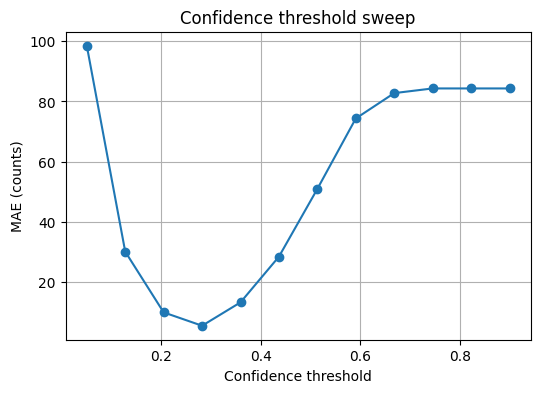

In [34]:
#@title 11/ NMS and threshold sweep diagnostics (confidence threshold vs count error & mAP)
# Simple function: for a range of conf thresholds, compute MAE between predicted counts and GT.
from ultralytics import YOLO
import numpy as np, os, glob, json
from sklearn.metrics import mean_absolute_error
DR = DRIVE_ROOT
data_yaml = os.path.join(DR,'data','data.yaml')
# find best checkpoint
# ckpts = glob.glob(os.path.join(DR,'experiments','**','*.pt'), recursive=True)
# if not ckpts:
#     print("Train model first")
# else:
model_path = "/content/runs/detect/yolov8_train_1761773967/weights/best.pt" # Use the provided path
y = YOLO(model_path)
# get test images and gt counts
import yaml
data = yaml.safe_load(open(data_yaml))
# test_imgs_dir = os.path.join(data['path'], data['test'])
# test_labels_dir = os.path.join(data['path'], data['test'].replace('images','labels'))
test_imgs_dir = os.path.join(DR,'data',data['test'].replace('../',''))
test_labels_dir = os.path.join(DR,'data',data['test'].replace('../','').replace('images','labels'))

print(f"Looking for images in: {test_imgs_dir}")
print(f"Looking for labels in: {test_labels_dir}")

imgs = glob.glob(os.path.join(test_imgs_dir, '*'))
print(f"Found {len(imgs)} images.")

gt_counts = {}
for lbl in glob.glob(os.path.join(test_labels_dir, '*.txt')):
    nm = os.path.splitext(os.path.basename(lbl))[0]
    gt_counts[nm] = len([l for l in open(lbl) if l.strip()])

print(f"Found {len(gt_counts)} ground truth labels with counts.")
if len(gt_counts) > 0:
    print("Example ground truth counts:", list(gt_counts.items())[:5])
else:
    print("No ground truth labels found.")


confs = np.linspace(0.05, 0.9, 12)
maes=[]
for c in confs:
    preds=[]
    gts=[]
    for im in imgs:
        res = y.predict(source=im, conf=float(c), verbose=False)
        cnt = sum([len(r.boxes) for r in res])
        nm = os.path.splitext(os.path.basename(im))[0]
        if nm in gt_counts:
            preds.append(cnt); gts.append(gt_counts[nm])
    if len(gts)>0:
        maes.append(mean_absolute_error(gts, preds))
    else:
        maes.append(None)

print("Calculated MAEs:", maes)

# plot

import matplotlib.pyplot as plt
plt.figure(figsize=(6,4))
plt.plot(confs, maes, marker='o')
plt.xlabel('Confidence threshold'); plt.ylabel('MAE (counts)')
plt.title('Confidence threshold sweep')
plt.grid(True); plt.show()

In [36]:
# ===========================
from ultralytics import YOLO
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, precision_recall_curve, average_precision_score

BASE_DIR = "/content/drive/MyDrive/tree_count"
MODEL_PATH = f"{BASE_DIR}/models/best.pt"  # adjust if you saved elsewhere
EVAL_PATH = f"{BASE_DIR}/reports/"
os.makedirs(EVAL_PATH, exist_ok=True)

In [40]:
# ===========================
# STEP 2: EVALUATE MODEL
# ===========================
model = YOLO('/content/runs/detect/yolov8_train_1761773967/weights/best.pt')

# Evaluate on validation set
results = model.val(
    data=f"{BASE_DIR}/data/data.yaml",  # your dataset YAML file
    split='val',
    imgsz=640,
    save_json=True,
    plots=True  # YOLO will auto-generate precision-recall curves, confusion matrix, etc.
)

# Save YOLO's auto-generated plots to your Drive reports folder
!cp -r runs/val/* "{EVAL_PATH}/"
print(f"Evaluation results saved in {EVAL_PATH}")


Ultralytics YOLOv8.1.0 🚀 Python-3.12.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/tree_count/data/valid/labels.cache... 18 images, 0 backgrounds, 0 corrupt: 100%|██████████| 18/18 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.12it/s]


                   all         18       1524      0.866      0.818      0.841      0.363
Speed: 0.5ms preprocess, 24.2ms inference, 0.0ms loss, 5.0ms postprocess per image
Saving runs/detect/val5/predictions.json...
Results saved to runs/detect/val5
cp: cannot stat 'runs/val/*': No such file or directory
Evaluation results saved in /content/drive/MyDrive/tree_count/reports/


In [ ]:

# Access the confusion matrix from the results object
cm = results.confusion_matrix.matrix  # Assuming the matrix is stored under the 'matrix' attribute

TP = np.diag(cm)
FP = cm.sum(axis=0) - TP
FN = cm.sum(axis=1) - TP
TN = cm.sum() - (FP + FN + TP)

precision = TP / (TP + FP + 1e-9)
recall = TP / (TP + FN + 1e-9)
f1 = 2 * (precision * recall) / (precision + recall + 1e-9)

print(f"Precision per class: {precision}")
print(f"Recall per class: {recall}")
print(f"F1 Score per class: {f1}")

Precision per class: [    0.86745           0]
Recall per class: [    0.81959           0]
F1 Score per class: [    0.84284           0]


Using sample image: /content/drive/MyDrive/tree_count/data/valid/images/sg_262078_4_174318_4_19_jpg.rf.5c4dbecea3f46460a9534d7772e59149.jpeg

image 1/1 /content/drive/MyDrive/tree_count/data/valid/images/sg_262078_4_174318_4_19_jpg.rf.5c4dbecea3f46460a9534d7772e59149.jpeg: 640x640 69 trees, 7.4ms
Speed: 3.7ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


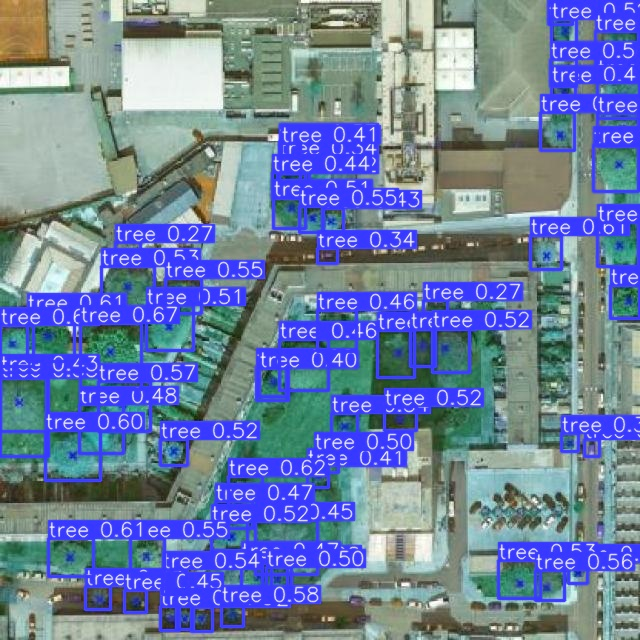

In [ ]:

from PIL import Image
import cv2
import random
import glob
import os # Import os module

BASE_DIR = "/content/drive/MyDrive/tree_count"
val_images_path = os.path.join(BASE_DIR, "data", "valid", "images") # Correctly construct the path

# Get a list of all image files in the validation directory
image_files = glob.glob(os.path.join(val_images_path, '*'))

if image_files:
    # Select a random image file
    sample_img_path = random.choice(image_files)
    print(f"Using sample image: {sample_img_path}")

    img = Image.open(sample_img_path)

    # Load the trained model
    model_path = "/content/runs/detect/yolov8_train_1761773967/weights/best.pt" # Use the provided path
    model = YOLO(model_path)

    # Predict
    # Set save=True to save the annotated image to the 'runs' directory by default
    results = model.predict(source=sample_img_path, conf=0.25, save=True, show=False)[0]

    # The annotated image is saved by default in runs/detect/predict
    # Find the path to the saved annotated image
    runs_dir = "runs/detect/predict"
    annotated_img_path = os.path.join(runs_dir, os.path.basename(sample_img_path))

    # Read the annotated image using OpenCV for displaying in Colab
    annotated = cv2.imread(annotated_img_path)
    # Convert BGR to RGB for displaying with cv2_imshow
    annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    # Display the annotated image
    # Use cv2_imshow for displaying in Google Colab
    from google.colab.patches import cv2_imshow
    cv2_imshow(annotated_rgb)

else:
    print(f"No image files found in {val_images_path}")